# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

---
## Step 0: Load The Data

In [10]:
# Load pickled data
import pickle

training_file = 'data/train.p'
validation_file= 'data/valid.p'
testing_file =  'data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

In [11]:
import numpy as np

# Number of training examples
n_train = len(X_train)

# Number of validation examples
n_validation = len(X_valid)

# Number of testing examples.
n_test = len(X_test)

# What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# How many unique classes/labels there are in the dataset.
n_classes = len(set(y_train))

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

print("Minimum training pixel value = ", X_train.min())
print("Maximum training pixel value = ", X_train.max())
print("Mean training pixel value = ", X_train.mean())

Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43
Minimum training pixel value =  0
Maximum training pixel value =  255
Mean training pixel value =  82.6775890369964


### Exploratory visualization of the dataset

0- Speed limit (20km/h): 


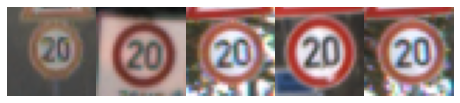

1- Speed limit (30km/h): 


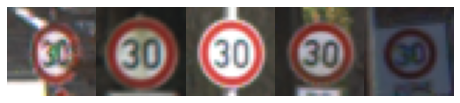

2- Speed limit (50km/h): 


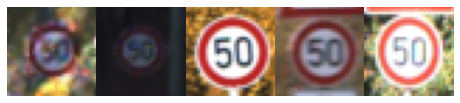

3- Speed limit (60km/h): 


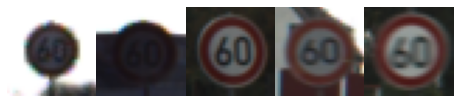

4- Speed limit (70km/h): 


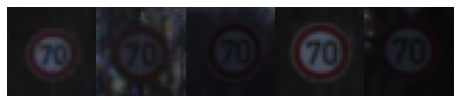

5- Speed limit (80km/h): 


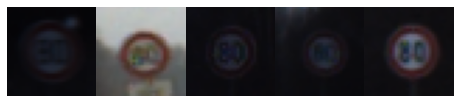

6- End of speed limit (80km/h): 


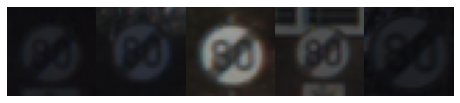

7- Speed limit (100km/h): 


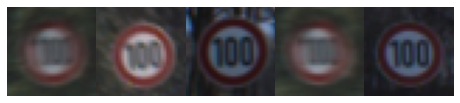

8- Speed limit (120km/h): 


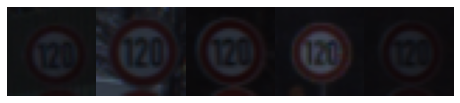

9- No passing: 


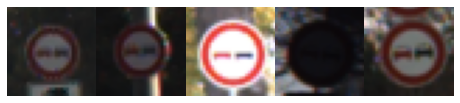

10- No passing for vehicles over 3.5 metric tons: 


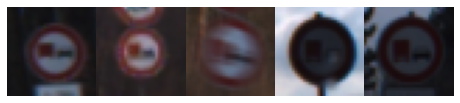

11- Right-of-way at the next intersection: 


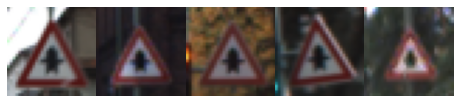

12- Priority road: 


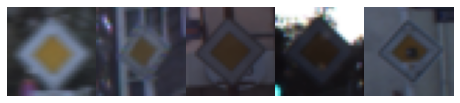

13- Yield: 


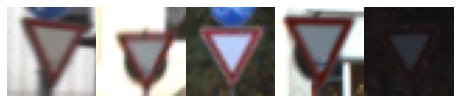

14- Stop: 


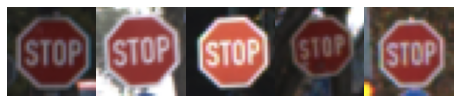

15- No vehicles: 


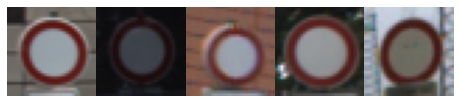

16- Vehicles over 3.5 metric tons prohibited: 


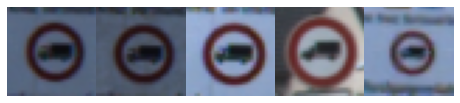

17- No entry: 


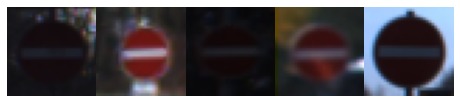

18- General caution: 


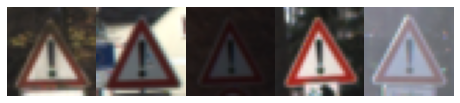

19- Dangerous curve to the left: 


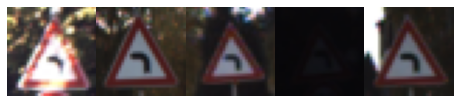

20- Dangerous curve to the right: 


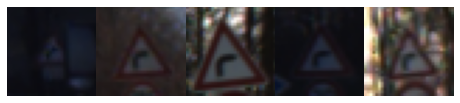

21- Double curve: 


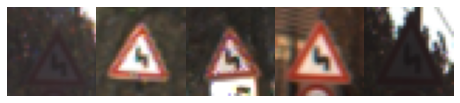

22- Bumpy road: 


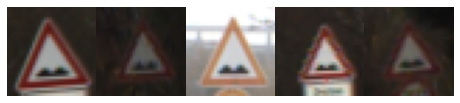

23- Slippery road: 


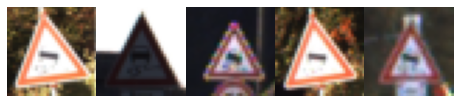

24- Road narrows on the right: 


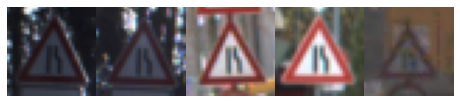

25- Road work: 


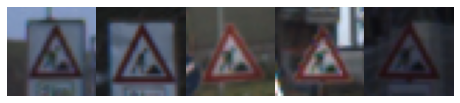

26- Traffic signals: 


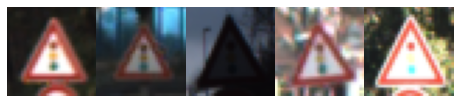

27- Pedestrians: 


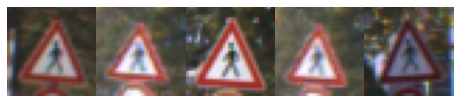

28- Children crossing: 


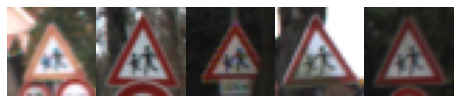

29- Bicycles crossing: 


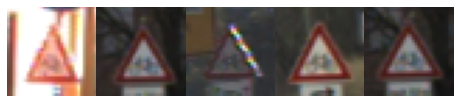

30- Beware of ice/snow: 


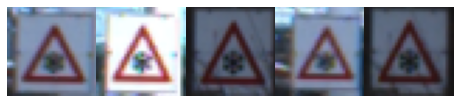

31- Wild animals crossing: 


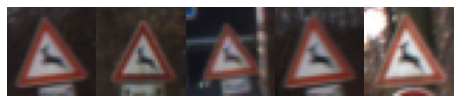

32- End of all speed and passing limits: 


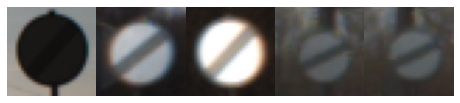

33- Turn right ahead: 


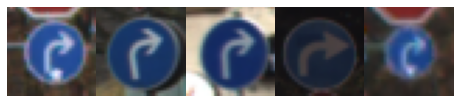

34- Turn left ahead: 


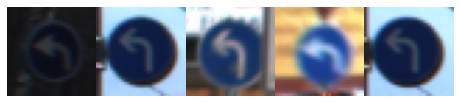

35- Ahead only: 


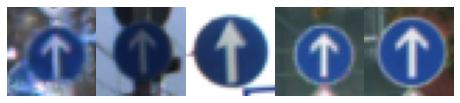

36- Go straight or right: 


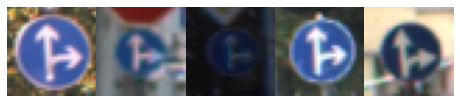

37- Go straight or left: 


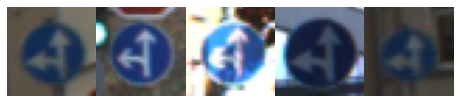

38- Keep right: 


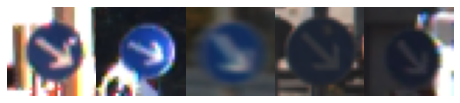

39- Keep left: 


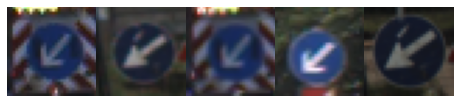

40- Roundabout mandatory: 


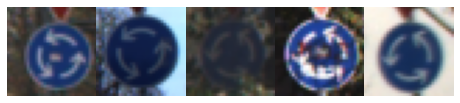

41- End of no passing: 


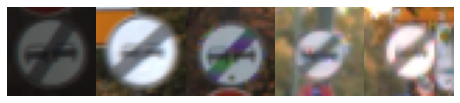

42- End of no passing by vehicles over 3.5 metric tons: 


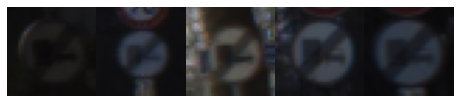

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
# Visualizations will be shown in the notebook.
%matplotlib inline

sign_class_df = pd.read_csv('./signnames.csv')

# Display a sample of images of each class with labels as titles
def display_sample(X, y, n, c='gray'):
    for sign in sign_class_df.values:
        print("{}- {}: ".format(sign[0], sign[1]))
        sign_samples = np.where(y == sign[0])[0]
        idx = np.random.choice(sign_samples, n, replace=False)

        fig = plt.figure(figsize=(8,5))
        fig.subplots_adjust(hspace = 0, wspace = 0)

        for i in range(n):
            axis = fig.add_subplot(1,n, i+1)
            axis.axis('off')
            axis.imshow(X[idx[i]], cmap=c)

        plt.show()

display_sample(X_train, y_train, 5, c=None)


Samples per class
Class : No. of samples

Speed limit (20km/h) : 180
Speed limit (30km/h) : 1980
Speed limit (50km/h) : 2010
Speed limit (60km/h) : 1260
Speed limit (70km/h) : 1770
Speed limit (80km/h) : 1650
End of speed limit (80km/h) : 360
Speed limit (100km/h) : 1290
Speed limit (120km/h) : 1260
No passing : 1320
No passing for vehicles over 3.5 metric tons : 1800
Right-of-way at the next intersection : 1170
Priority road : 1890
Yield : 1920
Stop : 690
No vehicles : 540
Vehicles over 3.5 metric tons prohibited : 360
No entry : 990
General caution : 1080
Dangerous curve to the left : 180
Dangerous curve to the right : 300
Double curve : 270
Bumpy road : 330
Slippery road : 450
Road narrows on the right : 240
Road work : 1350
Traffic signals : 540
Pedestrians : 210
Children crossing : 480
Bicycles crossing : 240
Beware of ice/snow : 390
Wild animals crossing : 690
End of all speed and passing limits : 210
Turn right ahead : 599
Turn left ahead : 360
Ahead only : 1080
Go straight or r

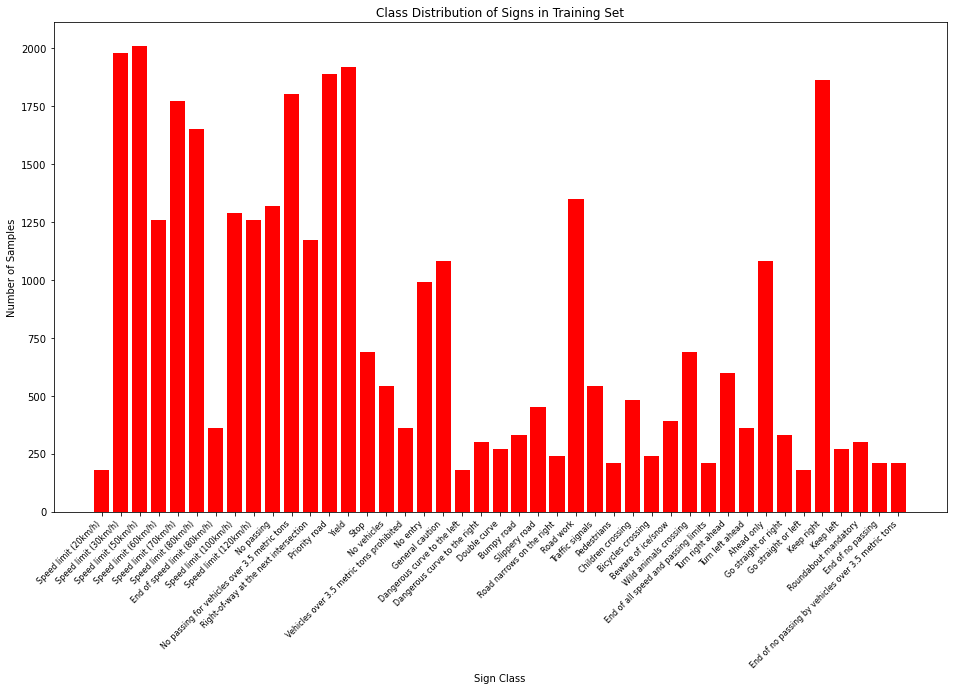

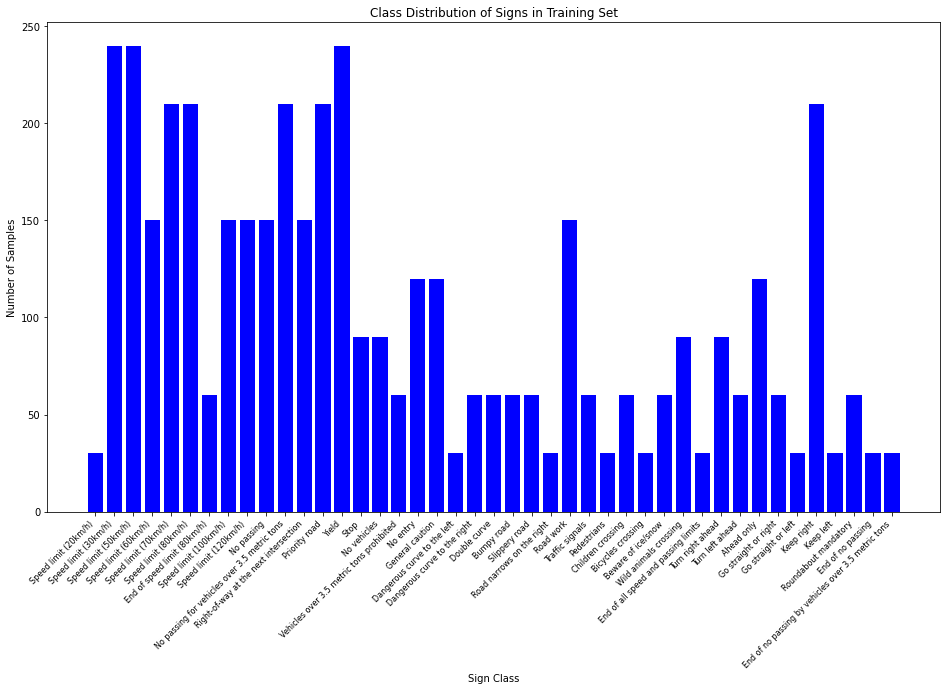

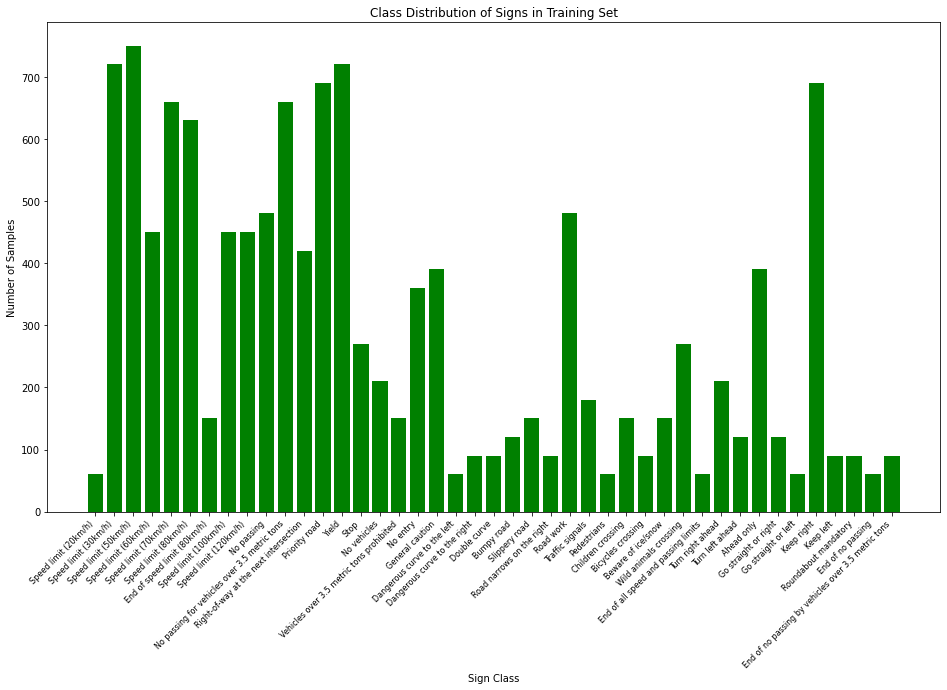

In [13]:
# Create a bar chart of class frequencies
def visualise_classes(num_classes, frequencies, set_title, bar_color=None):
    fig = plt.figure(figsize=(16,9))
    plt.bar(range(num_classes), frequencies, color=bar_color)
    plt.xticks(range(num_classes), sign_class_df.SignName.values, horizontalalignment='right', rotation=45, size=8)
    plt.xlabel('Sign Class')
    plt.ylabel('Number of Samples')
    title = f'Class Distribution of Signs in {set_title} Set'
    plt.title('Class Distribution of Signs in Training Set')
    plt.show()

# Class frequency
# Number of samples per class
samples_per_sign = np.bincount(y_train)

print("Samples per class")
print("Class : No. of samples\n")
for sign in sign_class_df.values:
    print("{} : {}".format(sign[1], len(np.where(y_train == sign[0])[0])))

print("\nMinimum samples for any class: {}".format(np.min(samples_per_sign)))
print("Maximum samples for any class: {}".format(np.max(samples_per_sign)))

# Visualise distribution of data sets
visualise_classes(n_classes, samples_per_sign, 'Training', bar_color='r')
visualise_classes(n_classes, np.bincount(y_valid), 'Validation', bar_color='b')
visualise_classes(n_classes, np.bincount(y_test), 'Test', bar_color='g')

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test the model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

### Pre-process the Data Set (normalization, grayscale, etc.)

0- Speed limit (20km/h): 


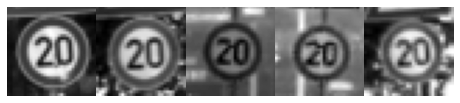

1- Speed limit (30km/h): 


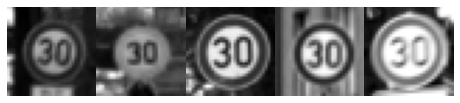

2- Speed limit (50km/h): 


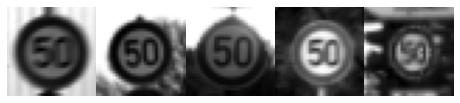

3- Speed limit (60km/h): 


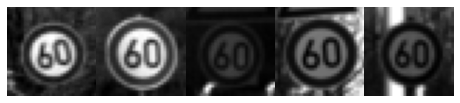

4- Speed limit (70km/h): 


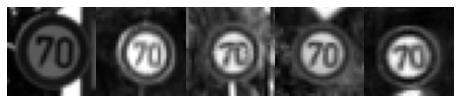

5- Speed limit (80km/h): 


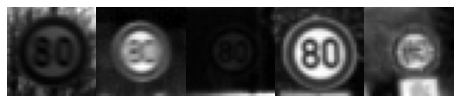

6- End of speed limit (80km/h): 


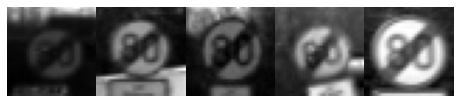

7- Speed limit (100km/h): 


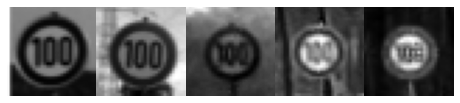

8- Speed limit (120km/h): 


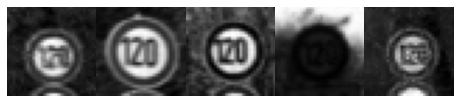

9- No passing: 


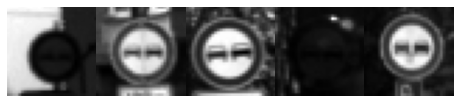

10- No passing for vehicles over 3.5 metric tons: 


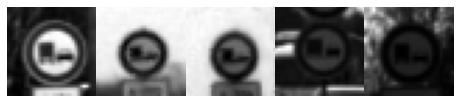

11- Right-of-way at the next intersection: 


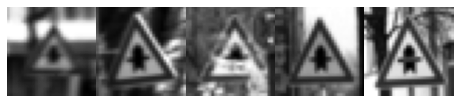

12- Priority road: 


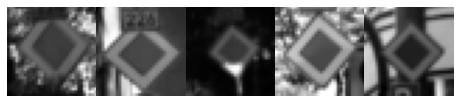

13- Yield: 


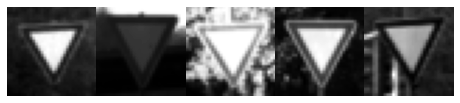

14- Stop: 


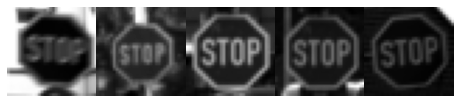

15- No vehicles: 


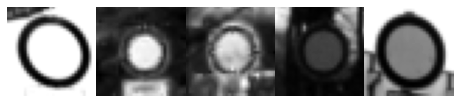

16- Vehicles over 3.5 metric tons prohibited: 


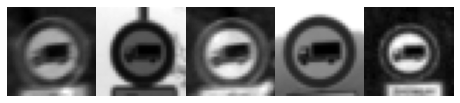

17- No entry: 


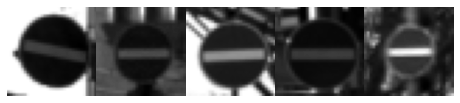

18- General caution: 


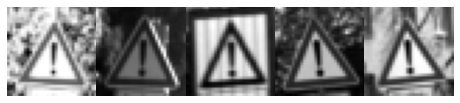

19- Dangerous curve to the left: 


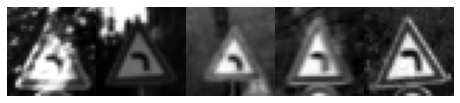

20- Dangerous curve to the right: 


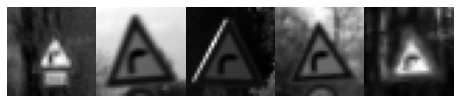

21- Double curve: 


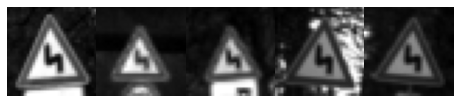

22- Bumpy road: 


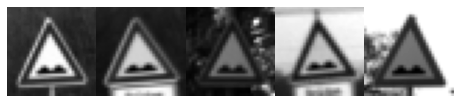

23- Slippery road: 


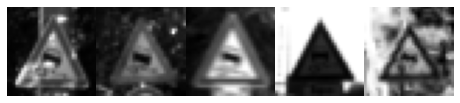

24- Road narrows on the right: 


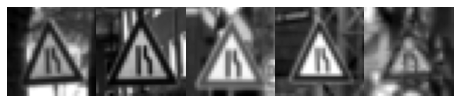

25- Road work: 


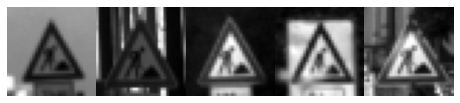

26- Traffic signals: 


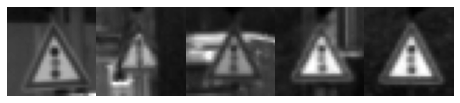

27- Pedestrians: 


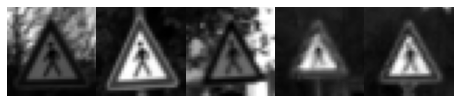

28- Children crossing: 


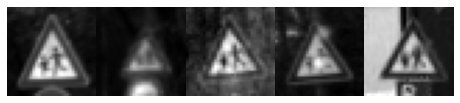

29- Bicycles crossing: 


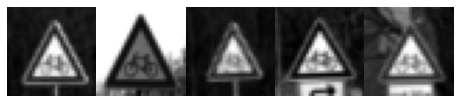

30- Beware of ice/snow: 


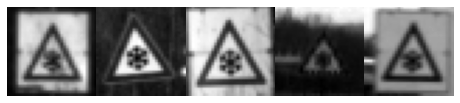

31- Wild animals crossing: 


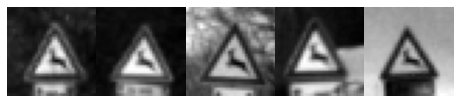

32- End of all speed and passing limits: 


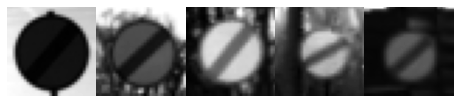

33- Turn right ahead: 


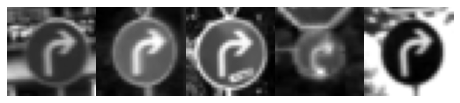

34- Turn left ahead: 


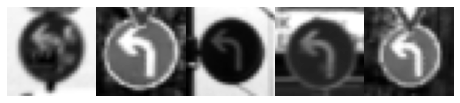

35- Ahead only: 


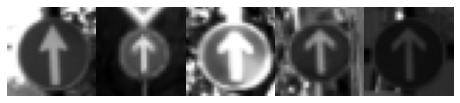

36- Go straight or right: 


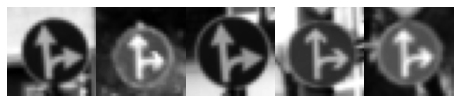

37- Go straight or left: 


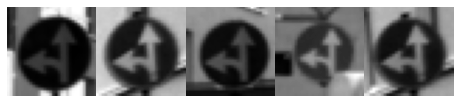

38- Keep right: 


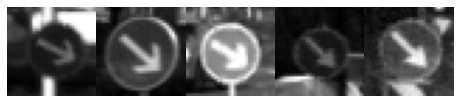

39- Keep left: 


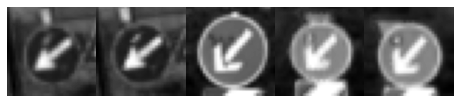

40- Roundabout mandatory: 


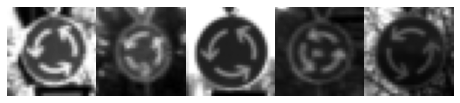

41- End of no passing: 


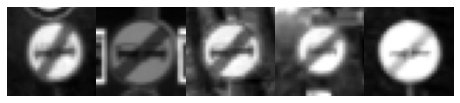

42- End of no passing by vehicles over 3.5 metric tons: 


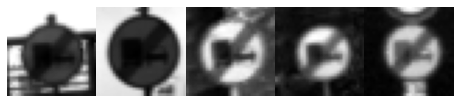

In [14]:
# Grayscale: average of each colour channel
X_train_gray = np.mean(X_train, axis=3, keepdims=True)
X_valid_gray = np.mean(X_valid, axis=3, keepdims=True)
X_test_gray = np.mean(X_test, axis=3, keepdims=True)

display_sample(X_train_gray.squeeze(), y_train, 5)




0- Speed limit (20km/h): 


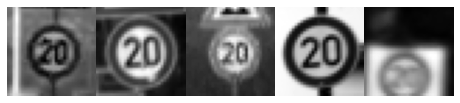

1- Speed limit (30km/h): 


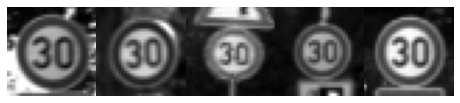

2- Speed limit (50km/h): 


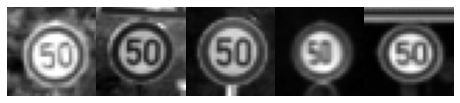

3- Speed limit (60km/h): 


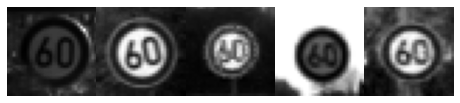

4- Speed limit (70km/h): 


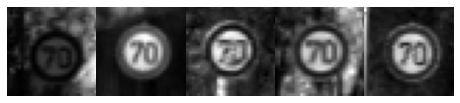

5- Speed limit (80km/h): 


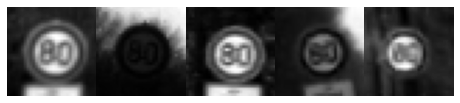

6- End of speed limit (80km/h): 


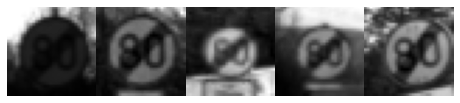

7- Speed limit (100km/h): 


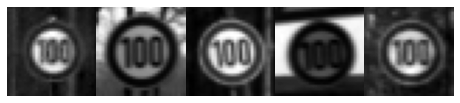

8- Speed limit (120km/h): 


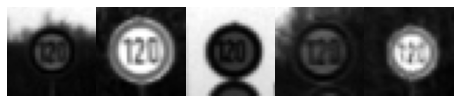

9- No passing: 


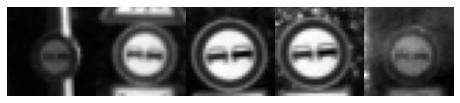

10- No passing for vehicles over 3.5 metric tons: 


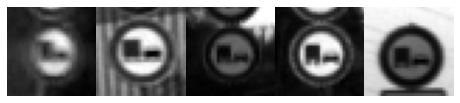

11- Right-of-way at the next intersection: 


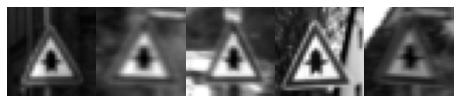

12- Priority road: 


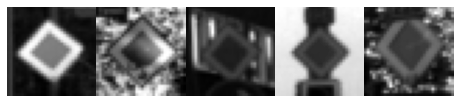

13- Yield: 


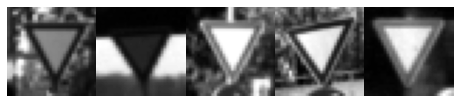

14- Stop: 


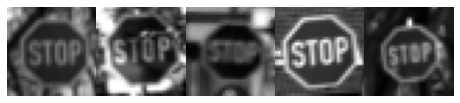

15- No vehicles: 


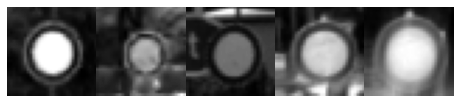

16- Vehicles over 3.5 metric tons prohibited: 


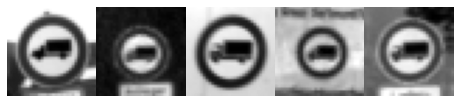

17- No entry: 


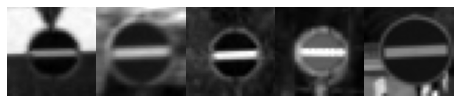

18- General caution: 


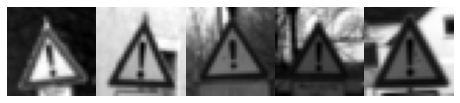

19- Dangerous curve to the left: 


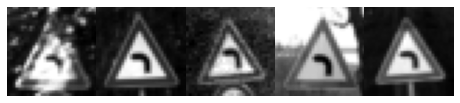

20- Dangerous curve to the right: 


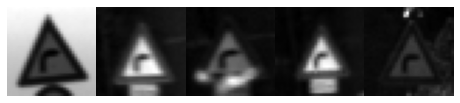

21- Double curve: 


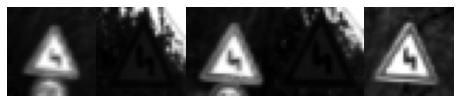

22- Bumpy road: 


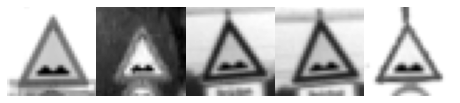

23- Slippery road: 


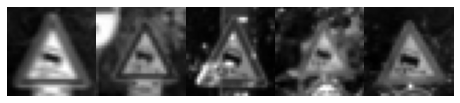

24- Road narrows on the right: 


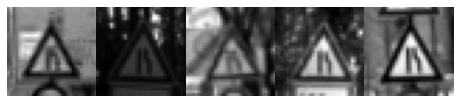

25- Road work: 


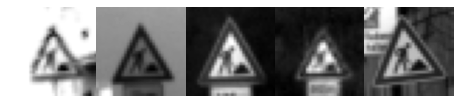

26- Traffic signals: 


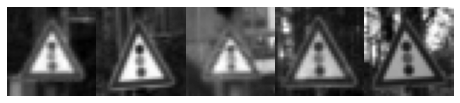

27- Pedestrians: 


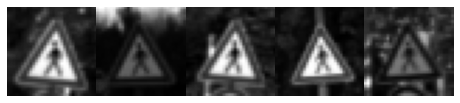

28- Children crossing: 


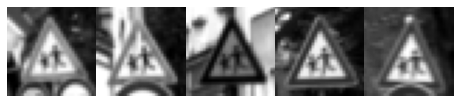

29- Bicycles crossing: 


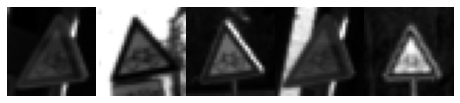

30- Beware of ice/snow: 


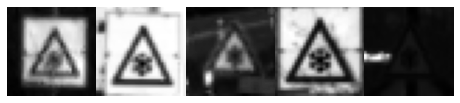

31- Wild animals crossing: 


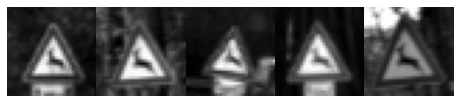

32- End of all speed and passing limits: 


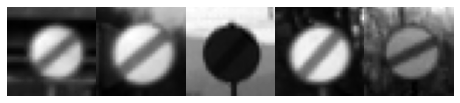

33- Turn right ahead: 


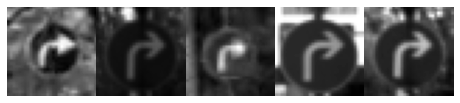

34- Turn left ahead: 


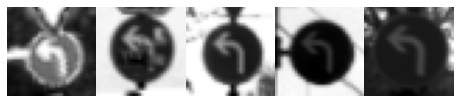

35- Ahead only: 


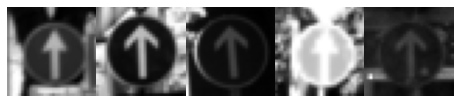

36- Go straight or right: 


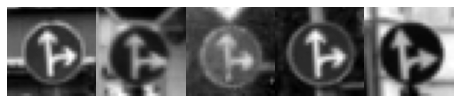

37- Go straight or left: 


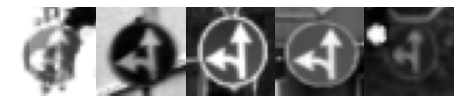

38- Keep right: 


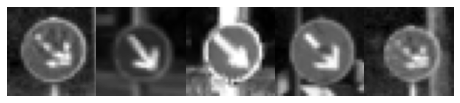

39- Keep left: 


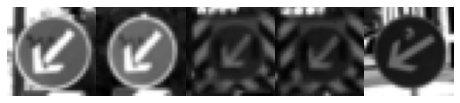

40- Roundabout mandatory: 


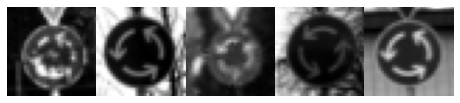

41- End of no passing: 


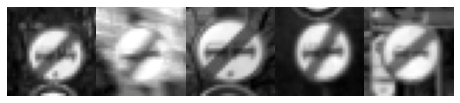

42- End of no passing by vehicles over 3.5 metric tons: 


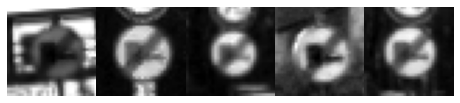

In [15]:
# Normalise the images to between -1 and 1
X_train_norm = (X_train_gray - 128) / 128
X_valid_norm = (X_valid_gray - 128) / 128
X_test_norm = (X_test_gray - 128) / 128

display_sample(X_train_norm.squeeze(), y_train, 5)


In [16]:
from sklearn.utils import shuffle
# Shuffle the training and validation data
print(y_train[0:50])
print(y_valid[0:50])
print(y_test[0:50])

# Test set seems to be adequately shuffled
X_train_norm, y_train = shuffle(X_train_norm, y_train)
X_valid_norm, y_valid = shuffle(X_valid_norm, y_valid)

[41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41
 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41
 41 41]
[41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41
 41 41 41 41 41 41 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31
 31 31]
[16  1 38 33 11 38 18 12 25 35 12  7 23  7  4  9 21 20 27 38  4 33  9  3
  1 11 13 10  9 11  5 17 34 23  2 17  3 12 16  8  7 30 18 12 24 25  3 10
 18  8]


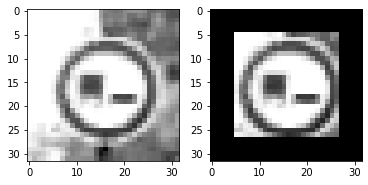

In [17]:
# Compare given images side by side
def compare_images(imgs):
    n = len(imgs)
    rows = int(np.floor(np.sqrt(n)))
    cols = int(np.ceil(np.sqrt(n)))
    if (rows*cols < n): cols+=1
    
    fig = plt.figure()
    for i in range(n):
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(imgs[i].squeeze(), cmap='gray')

# Test an augmentation method and compare before and after images
def test_augmentation(func):
    idx = np.random.randint(0, len(X_train_norm))
    example_img = X_train_norm[idx]
    example_augment = func(example_img)
    compare_images([example_img, example_augment])

# Randomly crop an image using a given border size
def random_crop(img, size=0.15):
    h, w = img.shape[:2]
    xc = int(size * np.random.random() * w + 1)

    result = img[xc:-xc, xc:-xc, :]
    result = np.pad(result, ((xc,xc),(xc,xc),(0,0)))

    return result

test_augmentation(random_crop)

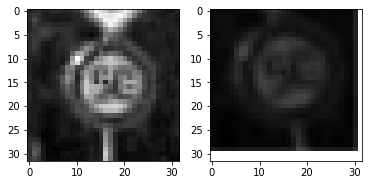

In [18]:
import cv2

# Randomly rotate, translate and scale an image within specified limits
def random_affine_transform(img, theta=25, trans=(0.1, 0.1), scale=(0.8, 1.2)):
    h, w = img.shape[:2]
    cx, cy = w//2, h//2

    # Rotation: Sample random number between (-1, 1] * theta
    angle = theta * (2 * np.random.random() - 1) + 0.1
    # Scaling: Sample random number between [0, 1) and adjust to range specified in scale
    sf = (scale[1] - scale[0]) * np.random.random() + scale[0]

    # Create a rotation matrix from the center of image with scale factor sf
    M = cv2.getRotationMatrix2D((cx, cy), angle, sf)
    # Transform image using the rotation matrix with the specified size
    result = cv2.warpAffine(img, M, (h, w), False)

    # Translating: Sample random number between [0, 1) and adjust to range specified in trans
    trans_x = trans[0] * (2 * np.random.random() - 1)
    trans_y = trans[1] * (2 * np.random.random() - 1)
    # Create the translation matrix and perform transformation
    T = np.array([[1, 0, trans_x*w], [0, 1, trans_y*h]])
    result = cv2.warpAffine(result, T, (h,w), False)

    return result[:,:,np.newaxis]

test_augmentation(random_affine_transform)

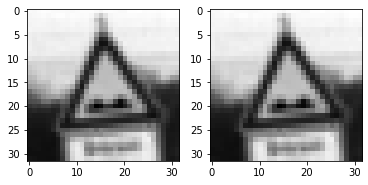

In [19]:
# Randomly adjust brightness with a given limit
def random_brightness(img, brightness = (-0.15, 0.15)):
    result = np.zeros_like(img)

    if img.shape[2] == 1:
        bf = (brightness[1] - brightness[0]) * np.random.random() - np.abs(brightness[0])
        # Overflows if result exceeds 255 when adding normally so must account for that
        if bf < 0:
            result = np.where((-1 - img) > bf, -1, img+bf)
        else:
            result = np.where((1 - img) < bf, 1, img+bf)
    else:
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        brightness = ((brightness[1] - brightness[0]) * np.random.random() - np.abs(brightness[0])) * 255

        if brightness < 0:
            hsv[:,:,2] = np.where((0 - hsv[:,:,2]) > brightness, 0, hsv[:,:,2]+brightness)
        else:
            hsv[:,:,2] = np.where((255 - hsv[:,:,2]) < brightness, 255, hsv[:,:,2]+brightness)

        result = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    return result

test_augmentation(random_brightness)

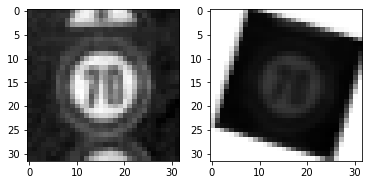

In [21]:
# Chain all augmentations on an image
def augment(img):
    return random_affine_transform(random_crop(random_brightness(img)))

test_augmentation(augment)

In [22]:
# print(X_train_norm.shape)
# tgt_samples = 1200

# # Store indices of augmented images
# before_idxs = []
# after_idxs = []
# for cl in range(n_classes):
#     print(f"Augmenting class: {cl+1}")
#     if samples_per_sign[cl] < tgt_samples:
#         class_idxs = np.where(y_train == cl)[0]
#         sample_diff = tgt_samples - samples_per_sign[cl]
#         print(f"Adding {sample_diff} samples...")
#         for i in range(sample_diff):
#             template = np.random.choice(class_idxs)
#             new_img = augment(X_train_norm[template])
#             before_idxs.append(template)
#             after_idxs.append(X_train_norm.shape[0])
#             X_train_norm = np.concatenate((X_train_norm, [new_img]))
#             y_train = np.concatenate((y_train, [cl]))
            
#             if (i+1) % 50 == 0:
#                 print(f"{i+1}/{sample_diff}")
        
#     print(f"{X_train_norm.shape}")



In [23]:
# # Save the augmented data
# aug_train = {'features': X_train_norm, 'labels': y_train}
# aug_indices = {'before_idxs' : before_idxs, 'after_idxs' : after_idxs}
# f_name = './augmented_data/train.p'
# with open(f_name, 'wb') as f:
#     pickle.dump(aug_train, f)
#     pickle.dump(aug_indices, f)

# print('Data saved.')

In [24]:
# Load the augmented pickle data
f_name = './augmented_data/train.p'
with open(f_name, 'rb') as f:
    train = pickle.load(f)
    tr_idxs = pickle.load(f)

X_train_norm, y_train = train['features'], train['labels']
before_idxs = tr_idxs['before_idxs']
after_idxs = tr_idxs['after_idxs']

print('Data loaded.')
# print("Original X_train:", X_train_norm.shape)
# print("Loaded X_train:", X_train_norm1.shape)
# print("Original y_train:", y_train.shape)
# print("Loaded y_train:", y_train1.shape)

# print("Original before_idxs:", len(before_idxs))
# print("Loaded before_idxs:", len(before_idxs1))
# print("Original after_idxs:", len(after_idxs))
# print("Loaded after_idxs:", len(after_idxs1))

Data loaded.


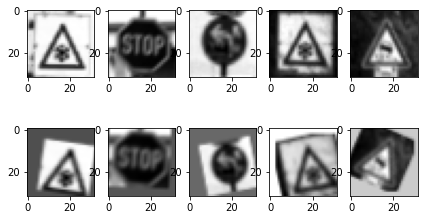

In [25]:
fig, axs = plt.subplots(2, 5, figsize=(7,4))
axs = axs.ravel()

aug_idxs = list(range(len(before_idxs)))
aug_sample = np.random.choice(aug_idxs, 5, replace=False)

for i in range(5):
    before_img = X_train_norm[before_idxs[aug_sample[i]]].squeeze()
    after_img = X_train_norm[after_idxs[aug_sample[i]]].squeeze()
    axs[i].imshow(before_img, cmap='gray')
    axs[i+5].imshow(after_img, cmap='gray')

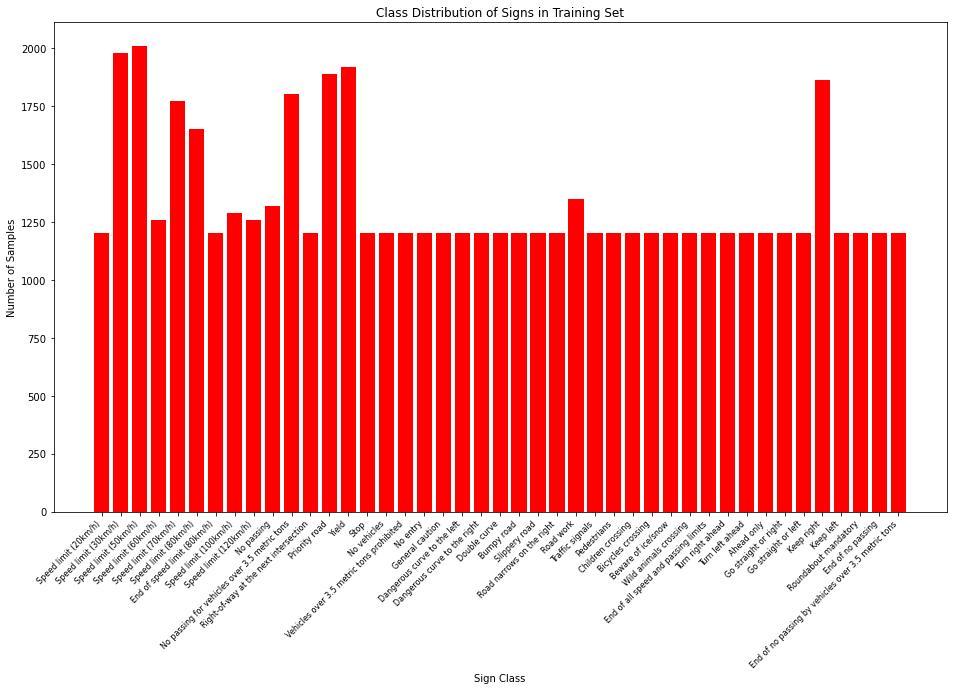

In [26]:
# Re-visualise distribution after augmentation
visualise_classes(n_classes, np.bincount(y_train), 'Training', bar_color='r')

### Model Architecture

In [32]:
### Define your architecture here.
### Feel free to use as many code cells as needed.
import tensorflow as tf
from tensorflow.contrib.layers import flatten

EPOCHS = 80
BATCH_SIZE = 128

def conv2d(x, W, b, stride=1, pad='VALID'):
    result = tf.nn.conv2d(x, W, strides=[1, stride, stride, 1], padding=pad)
    result = tf.nn.bias_add(result, b)
    
    return result

def maxpool(x, k=2, pad='VALID'):
    return tf.nn.max_pool(x, ksize=[1, k, k, 1], strides=[1, k, k, 1], padding=pad)

def leNet(x):
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    W1 = tf.Variable(tf.truncated_normal([5, 5, 1, 6], mean=mu, stddev=sigma), name='w1_train')
    B1 = tf.Variable(tf.zeros(6))
    conv1 = conv2d(x, W1, B1)
    
    # Activation.
    conv1 = tf.nn.relu(conv1)
    
    # Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = maxpool(conv1)
    
    # Layer 2: Convolutional. Output = 10x10x16.
    W2 = tf.Variable(tf.truncated_normal([5, 5, 6, 16], mean=mu, stddev=sigma), name='w2_train')
    B2 = tf.Variable(tf.zeros(16))
    conv2 = conv2d(conv1, W2, B2)
    
    # Activation
    conv2 = tf.nn.relu(conv2)
    
    # Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = maxpool(conv2)

    # Layer 3: Convolutional. Output = 1x1x400.
    W3 = tf.Variable(tf.truncated_normal([5, 5, 16, 400], mean=mu, stddev=sigma), name='w3_train')
    B3 = tf.Variable(tf.zeros(400))
    conv3 = conv2d(conv2, W3, B3)
    
    # Activation
    conv3 = tf.nn.relu(conv3)
    
    # Flatten. Input = 1x1x400. Output = 400.
    conv3 = flatten(conv3)

    # Flatten - branched. Input = 5x5x16. Output = 400
    conv2a = flatten(conv2)

    # Concatenate. Output = 400
    conv3 = tf.concat([conv3, conv2a], 1)

    # Dropout
    conv3 = tf.nn.dropout(conv3, rate=1-keep_prob)
    
    # Layer 3: Fully Connected. Input = 800. Output = 400.
    W4 = tf.Variable(tf.truncated_normal([800, 400], mean=mu, stddev=sigma), name='w4_train')
    B4 = tf.Variable(tf.zeros(400))
    fc1 = tf.add(tf.matmul(conv3, W4), B4)
    
    # # Activation.
    # fc1 = tf.nn.relu(fc1)

    # Dropout
    fc1 = tf.nn.dropout(fc1, rate=1-keep_prob)
    
    # Layer 4: Fully Connected. Input = 400. Output = 43.
    W5 = tf.Variable(tf.truncated_normal([400, 43], mean=mu, stddev=sigma), name='w5_train')
    B5 = tf.Variable(tf.zeros(43))
    logits = tf.add(tf.matmul(fc1, W5), B5)
    
    # # Activation
    # fc2 = tf.nn.relu(fc2)

    # # Dropout
    # fc2 = tf.nn.dropout(fc2, rate=1-keep_prob)
    
    # # Layer 5: Fully Connected. Input = 200. Output = 100.
    # W6 = tf.Variable(tf.truncated_normal([200, 100], mean=mu, stddev=sigma), name='w6_train')
    # B6 = tf.Variable(tf.zeros(100))
    # fc3 = tf.add(tf.matmul(fc2, W6), B6)
    
    # # Dropout
    # fc3 = tf.nn.dropout(fc3, rate=1-keep_prob)
    
    # # Layer 5: Fully Connected. Input = 100. Output = 43.
    # W7 = tf.Variable(tf.truncated_normal([100, 43], mean=mu, stddev=sigma), name='w7_train')
    # B7 = tf.Variable(tf.zeros(43))
    # logits = tf.add(tf.matmul(fc3, W7), B7)

    return logits

### Train, Validate and Test the Model

A validation set can be used to assess how well the model is performing. A low accuracy on the training and validation
sets imply underfitting. A high accuracy on the training set but low accuracy on the validation set implies overfitting.

In [33]:
### Train your model here.
### Calculate and report the accuracy on the training and validation set.
### Once a final model architecture is selected, 
### the accuracy on the test set should be calculated and reported as well.
### Feel free to use as many code cells as needed.

# x is a placeholder for a batch of input images
# y is a placeholder for a batch of output labels.
x = tf.placeholder(tf.float32, [None, 32, 32, 1])
y = tf.placeholder(tf.int32, [None])
one_hot_y = tf.one_hot(y, n_classes)

keep_prob = tf.placeholder(tf.float32)

In [34]:
l_rate = 0.001
l2_lambda = 0.0001

logits = leNet(x)
# Calculate the cross-entropy between logits and ground truth with L2 regularisation for weights
cross_entropy = tf.nn.softmax_cross_entropy_with_logits_v2(labels=one_hot_y, logits=logits) + \
                l2_lambda *  tf.reduce_sum([tf.nn.l2_loss(t) for t in tf.trainable_variables() if 'train' in t.name])
# Average the cross-entropy across all training images
loss_operation = tf.reduce_mean(cross_entropy)
# Use Adam algorithm to minimise loss function similar to stochastic gradient descent
optimiser = tf.train.AdamOptimizer(learning_rate=l_rate)
# Use backpropogation to update the network and minimise training loss
training_operation = optimiser.minimize(loss_operation)

### Model Evaluation

In [35]:
correction_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
# Overall accuracy as average of individual correct predictions
accuracy_operation = tf.reduce_mean(tf.cast(correction_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(x_data, y_data):
    num_examples = len(x_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = x_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 1.0})
        total_accuracy += (accuracy * len(batch_x))
        
    return total_accuracy / num_examples

### Training

Run the training data through the training pipeline to train the model.

Before each epoch, shuffle the training set.

After each epoch, measure the loss and accuracy of the validation set.

Save the model after training.

In [21]:
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train)
    
    print("Training... \n")
    for i in range(EPOCHS):
        X_train_norm, y_train = shuffle(X_train_norm, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            batch_x, batch_y = X_train_norm[offset:offset+BATCH_SIZE], y_train[offset:offset+BATCH_SIZE]
            _, loss = sess.run([training_operation, loss_operation], feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5})
            
        training_accuracy = evaluate(X_train_norm, y_train)
        validation_accuracy = evaluate(X_valid_norm, y_valid)
        print("EPOCH {} ...".format(i+1))
        print("Training Accuracy = {:.3f}".format(training_accuracy))
        print("Validation Accuracy = {:.3f}, Loss = {:.3f}".format(validation_accuracy, loss))
        print()
        
    saver.save(sess, './lenet')
    print("Model saved.")

Training... 

EPOCH 1 ...
Training Accuracy = 0.760
Validation Accuracy = 0.783, Loss = 1.501

EPOCH 2 ...
Training Accuracy = 0.866
Validation Accuracy = 0.895, Loss = 0.806

EPOCH 3 ...
Training Accuracy = 0.898
Validation Accuracy = 0.911, Loss = 0.838

EPOCH 4 ...
Training Accuracy = 0.917
Validation Accuracy = 0.911, Loss = 0.835

EPOCH 5 ...
Training Accuracy = 0.940
Validation Accuracy = 0.939, Loss = 0.648

EPOCH 6 ...
Training Accuracy = 0.944
Validation Accuracy = 0.922, Loss = 0.452

EPOCH 7 ...
Training Accuracy = 0.955
Validation Accuracy = 0.947, Loss = 0.450

EPOCH 8 ...
Training Accuracy = 0.959
Validation Accuracy = 0.937, Loss = 0.588

EPOCH 9 ...
Training Accuracy = 0.969
Validation Accuracy = 0.954, Loss = 0.471

EPOCH 10 ...
Training Accuracy = 0.971
Validation Accuracy = 0.946, Loss = 0.408

EPOCH 11 ...
Training Accuracy = 0.973
Validation Accuracy = 0.951, Loss = 0.458

EPOCH 12 ...
Training Accuracy = 0.970
Validation Accuracy = 0.947, Loss = 0.391

EPOCH 13 ..

### Changelog

90.4%:
- Preprocessing: grayscale, normalisation
- Model: Lenet (orig), hyperparameters: epochs: 10, batch size: 128, l_rate: 0.001

92.2%:
- Model: Modified to 3-stage ConvNet architecture as in Sermanet, LeCun. Output from 2nd stage is branched out and concatenated with the 3rd stage output before being fed to the classifier. Reduced from 3 full-connected layers to a single layer serving as the classifier.

93.6%:
- Model: Implemented dropout with keep_prob = 0.5

95.1%:
- Reduced the learning rate to counter jitter.
- Hyperparameters: epochs: 10, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

90%:
- Added data augmentation using random rotate, translate, scale, crop and brightness operations
- Extended each class to 1200 signs

93.9%:
- Reduced the variance in the data augmentation

94.5%:
- Hyperparameters: epochs: 30, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

95.1%:
- Hyperparameters: epochs: 50, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

95.8%:
- Hyperparameters: epochs: 60, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

96.9%:
- Hyperparameters: epochs: 80, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

95.3%:
- Hyperparameters: epochs: 100, batch size: 128, l_rate: 0.0008, keep_prob: 0.5
- lots of jitter

91.3%:
- Implemented L2 regularization with lambda = 0.001
- Hyperparameters: epochs: 10, batch size: 128, l_rate: 0.0008, keep_prob: 0.5

92.1%:
- Hyperparameters: epochs: 10, batch size: 128, l_rate: 0.0008, keep_prob: 0.5, lambda: 0.0001

96.9%:
- Hyperparameters: epochs: 100, batch size: 128, l_rate: 0.0008, keep_prob: 0.5, lambda: 0.0001

95.4%:
- Hyperparameters: epochs: 100, batch size: 128, l_rate: 0.0005, keep_prob: 0.5, lambda: 0.0001

95.6%:
- Hyperparameters: epochs: 100, batch size: 128, l_rate: 0.00065, keep_prob: 0.5, lambda: 0.001

96.7%:
- Hyperparameters: epochs: 100, batch size: 128, l_rate: 0.0008, keep_prob: 0.5, lambda: 0.001

97.2%:
- Hyperparameters: epochs: 80, batch size: 128, l_rate: 0.0008, keep_prob: 0.5, lambda: 0.0001


Training Accuracy = 99.9%, Validation Accuracy = 96.8%, Loss = 0.161
- Model: Extra dropout, extra Fc layer

Training Accuracy = 99.7%, Validation Accuracy = 96.6%, Loss = 0.354:
- Model: Extra dropout, extra Fc layer

Training Accuracy = 99.8%, Validation Accuracy = 97.6%, Loss = 0.160:
- l_rate: 0.0007, batch_size=256

Training Accuracy = 99.6%, Validation Accuracy = 95.7%, Loss = 0.292
- l2_rate: 0.0002

Training Accuracy = 99.9%, Validation Accuracy = 97.3%, Loss = 0.167
- Model: Reverted back to single extra fc layer with dropout, l_rate: 0.001

Training Accuracy = 99.8%, Validation Accuracy = 97.4%, Loss = 0.290
- Hyperparameters: epochs: 80, batch size: 128, l_rate: 0.0008, keep_prob: 0.5, lambda: 0.0001




### Evaluate on test set

In [22]:
with tf.Session() as sess:
    saver.restore(sess, './lenet')
    test_accuracy = evaluate(X_test_norm, y_test)
    print(f"Test accuracy = {test_accuracy:.3f}")

print("Testing complete.")


Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from ./lenet
Test accuracy = 0.951
Testing complete.


---

## Step 3: Test a Model on New Images

To give yourself more insight into how your model is working, download at least five pictures of German traffic signs from the web and use your model to predict the traffic sign type.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Load and Output the Images

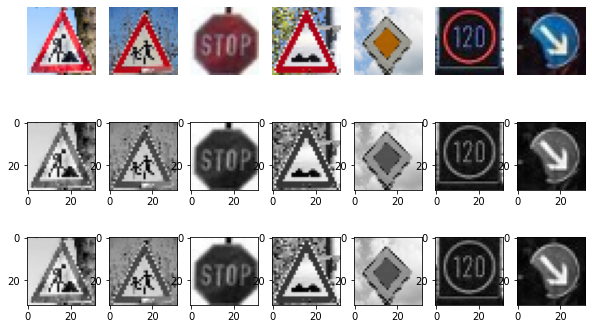

In [36]:
### Load the images and plot them here.
import glob

new_images_list = glob.glob('./new_images/image*')
new_images = np.array([])
new_images_gray = np.array([])
new_images_norm = np.array([])

for img in new_images_list:
    image = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (32,32))
    image_gray = np.mean(image, axis=2)
    image_norm = (image_gray - 128) / 128

    new_images = np.concatenate([new_images, image[np.newaxis, :, :, :]]) if new_images.size else image[np.newaxis, :, :, :]
    new_images_gray = np.concatenate([new_images_gray, image_gray[np.newaxis, :, :, np.newaxis]]) if new_images_gray.size else image_gray[np.newaxis, :, :, np.newaxis]
    new_images_norm = np.concatenate([new_images_norm, image_norm[np.newaxis, :, :, np.newaxis]]) if new_images_norm.size else image_norm[np.newaxis, :, :, np.newaxis]

fig, axs = plt.subplots(3, len(new_images), figsize=(10,6))
axs = axs.ravel()

for i in range(len(new_images)):
    axs[i].axis('off')
    axs[i].imshow(new_images[i])
    axs[i+len(new_images)].axis('off')
    axs[i+len(new_images)].imshow(new_images_gray[i].squeeze(), cmap='gray')
    axs[i+(2*len(new_images))].axis('off')
    axs[i+(2*len(new_images))].imshow(new_images_norm[i].squeeze(), cmap='gray')

### Predict the Sign Type for Each Image

In [37]:
### Run the predictions here and use the model to output the prediction for each image.
new_images_labels = np.array([25, 28, 14, 22, 12, 8, 38])
predictions = []

with tf.Session() as sess:
    saver.restore(sess, './lenet')
    predictions = sess.run(tf.argmax(logits, 1), feed_dict={x: new_images_norm, y: new_images_labels, keep_prob: 1.0})

print(f"Predictions = {predictions}")
print(f"Actual = {new_images_labels}")

INFO:tensorflow:Restoring parameters from ./lenet
Predictions = [25 28 14 22 12 14 38]
Actual = [25 28 14 22 12  8 38]


### Analyze Performance

In [38]:
### Calculate the accuracy for these 5 new images. 
### For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate on these new images.#
new_image_accuracy = sum([i-j == 0 for i,j in zip(predictions, new_images_labels)]) * 100 / len(predictions)
print(f"Model accuracy: {new_image_accuracy:.2f}%")

Model accuracy: 85.71%


### Output Top 5 Softmax Probabilities For Each Image Found on the Web

INFO:tensorflow:Restoring parameters from ./lenet
TopKV2(values=array([[1.0000000e+00, 6.6952780e-13, 4.9430914e-17, 4.2629835e-17,
        5.5008178e-19],
       [9.9995518e-01, 4.4617322e-05, 1.4917262e-07, 3.0064392e-08,
        1.0175053e-08],
       [1.0000000e+00, 4.3324047e-09, 2.1676211e-11, 9.7045236e-12,
        6.2866726e-12],
       [1.0000000e+00, 4.5647126e-09, 2.2758611e-20, 1.7400747e-23,
        1.0862878e-25],
       [1.0000000e+00, 4.4162531e-09, 3.2016867e-10, 3.3523961e-14,
        2.4914032e-14],
       [9.9946088e-01, 5.3914014e-04, 2.5777240e-09, 1.9729482e-09,
        7.5673934e-10],
       [1.0000000e+00, 4.5418742e-23, 3.7610537e-23, 5.8841021e-24,
        4.2958859e-28]], dtype=float32), indices=array([[25, 22, 12, 29, 13],
       [28, 24, 19, 27,  0],
       [14, 33, 22, 13,  4],
       [22, 29, 25, 15, 26],
       [12, 40,  7, 10,  9],
       [14,  0,  8, 17, 33],
       [38,  2, 21, 34, 11]]))
Top k finished.


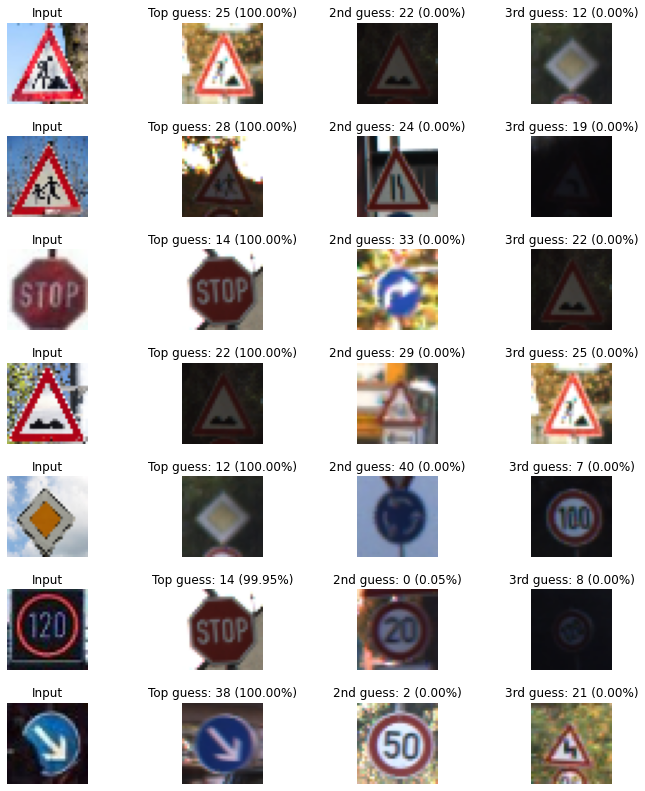

In [79]:
### Print out the top five softmax probabilities for the predictions on the German traffic sign images found on the web. 
### Feel free to use as many code cells as needed.
softmax_logits = tf.nn.softmax(logits)
top_k = tf.nn.top_k(softmax_logits, k=5)

with tf.Session() as sess:
    saver.restore(sess, "./lenet")
    result_top_k = sess.run(top_k, feed_dict={x: new_images_norm, keep_prob: 1.0})
    print(result_top_k)

print("Top k finished.")

# Display the top 3 guesses along with their confidence
fig, axs = plt.subplots(len(new_images), 4, figsize=(12, 14))
fig.subplots_adjust(hspace = .4, wspace=.2)
axs = axs.ravel()

for i, image in enumerate(new_images):
    axs[4*i].axis('off')
    axs[4*i].imshow(image)
    axs[4*i].set_title('Input')
    # Guess 1
    # Get the guess index by the model
    guess1 = result_top_k[1][i][0]
    # Example image of guess in dataset
    index1 = np.where(y_test == guess1)[0][0]
    axs[4*i+1].axis('off')
    axs[4*i+1].imshow(X_test[index1].squeeze(), cmap='gray')
    axs[4*i+1].set_title('Top guess: {} ({:.2f}%)'.format(guess1, 100*result_top_k[0][i][0]))
    # Guess 2
    guess2 = result_top_k[1][i][1]
    index2 = np.argwhere(y_test == guess2)[0]
    axs[4*i+2].axis('off')
    axs[4*i+2].imshow(X_test[index2].squeeze(), cmap='gray')
    axs[4*i+2].set_title('2nd guess: {} ({:.2f}%)'.format(guess2, 100*result_top_k[0][i][1]))
    # Guess 3
    guess3 = result_top_k[1][i][2]
    index3 = np.argwhere(y_test == guess3)[0]
    axs[4*i+3].axis('off')
    axs[4*i+3].imshow(X_test[index3].squeeze(), cmap='gray')
    axs[4*i+3].set_title('3rd guess: {} ({:.2f}%)'.format(guess3, 100*result_top_k[0][i][2]))

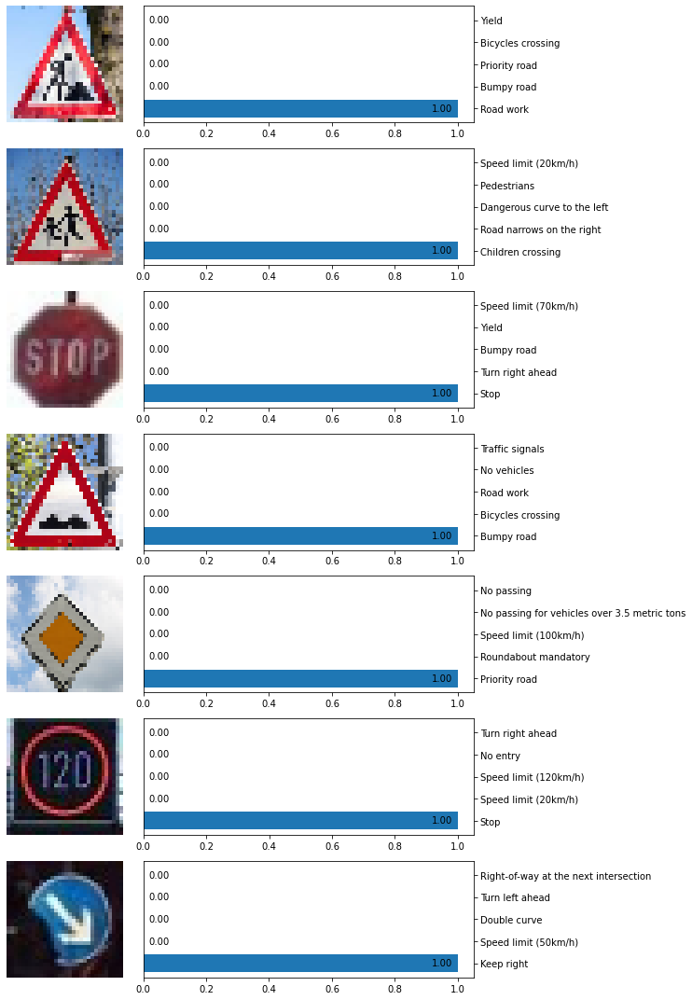

In [116]:
# Display the top-5 softmax probabilities
fig, axs = plt.subplots(len(new_images),2, figsize=(12, 15))
axs = axs.ravel()
fig.set_tight_layout(True)

for i in range(len(new_images)*2):
    if i % 2 == 0:
        axs[i].axis('off')
        axs[i].imshow(new_images[i//2])
    else:
        # Get the sign names from the dataframe
        x_axis = sign_class_df.SignName[result_top_k[1][(i-1)//2]].values
        y_axis = result_top_k[0][(i-1)//2]
        # Move y-ticks to the right
        axs[i].yaxis.set_ticks_position('right')
        # Horizontal bar chart
        rects = axs[i].barh(x_axis, y_axis)

        # Display the bar height
        for rect in rects:
            width = rect.get_width()
            if width < 0.2: 
                x = width + 0.05
            else:
                x = width - 0.05
            axs[i].text(x, rect.get_y() + rect.get_height()/2 - 0.2,
                    '%.2f' % width,
                    ha='center', va='bottom')
        